In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('D:\AI\diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 769 entries, 0 to 768
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               769 non-null    int64  
 1   Glucose                   769 non-null    int64  
 2   BloodPressure             769 non-null    int64  
 3   SkinThickness             769 non-null    int64  
 4   Insulin                   769 non-null    int64  
 5   BMI                       769 non-null    float64
 6   DiabetesPedigreeFunction  769 non-null    float64
 7   Age                       769 non-null    int64  
 8   Outcome                   769 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.2 KB


In [26]:
df.shape

(769, 9)

In [4]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [47]:
print(df.corr()['Outcome'].sort_values(ascending=False))


Outcome                     1.000000
Glucose                     0.466132
BMI                         0.293253
Age                         0.240816
Pregnancies                 0.219418
DiabetesPedigreeFunction    0.172406
Insulin                     0.129137
SkinThickness               0.072298
BloodPressure               0.065706
Name: Outcome, dtype: float64


In [31]:
df['Outcome'].value_counts()*100/len(df)


Outcome
0    65.019506
1    34.980494
Name: count, dtype: float64

Text(0.5, 1.0, 'Diabetes Outcome Proportion')

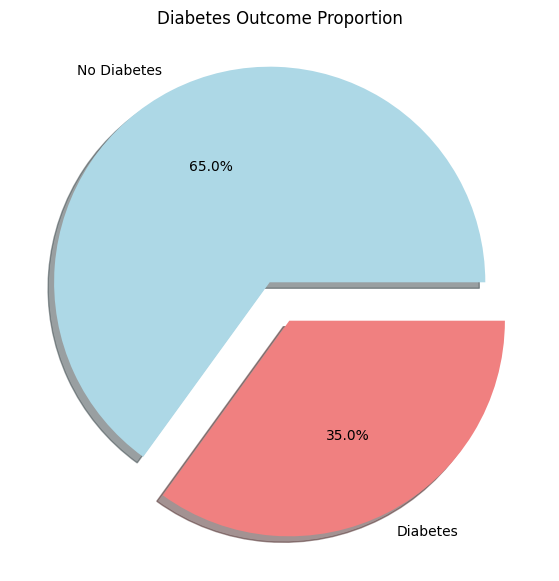

In [16]:
explode1 = [0.1, 0.1]
plt.figure(figsize=(8,7))
plt.pie(df['Outcome'].value_counts(), explode=explode1,shadow = True,labels=['No Diabetes', 'Diabetes'], autopct='%1.1f%%', colors=['lightblue', 'lightcoral'])
plt.title('Diabetes Outcome Proportion')

<Axes: xlabel='Outcome', ylabel='Age'>

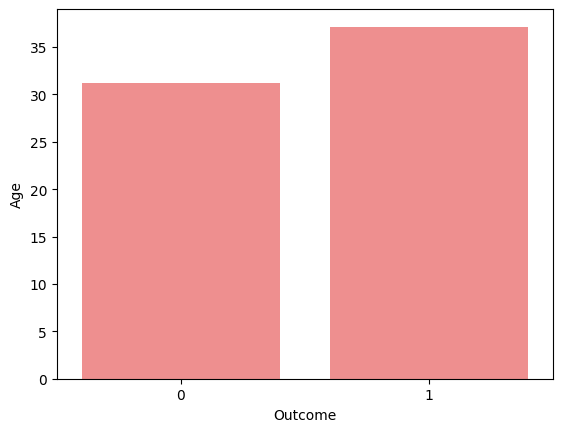

In [51]:
df_filtered = df.groupby('Outcome')['Age'].mean().reset_index()
sns.barplot(y=df_filtered['Age'], x=df_filtered['Outcome'],color='r',alpha=.5)


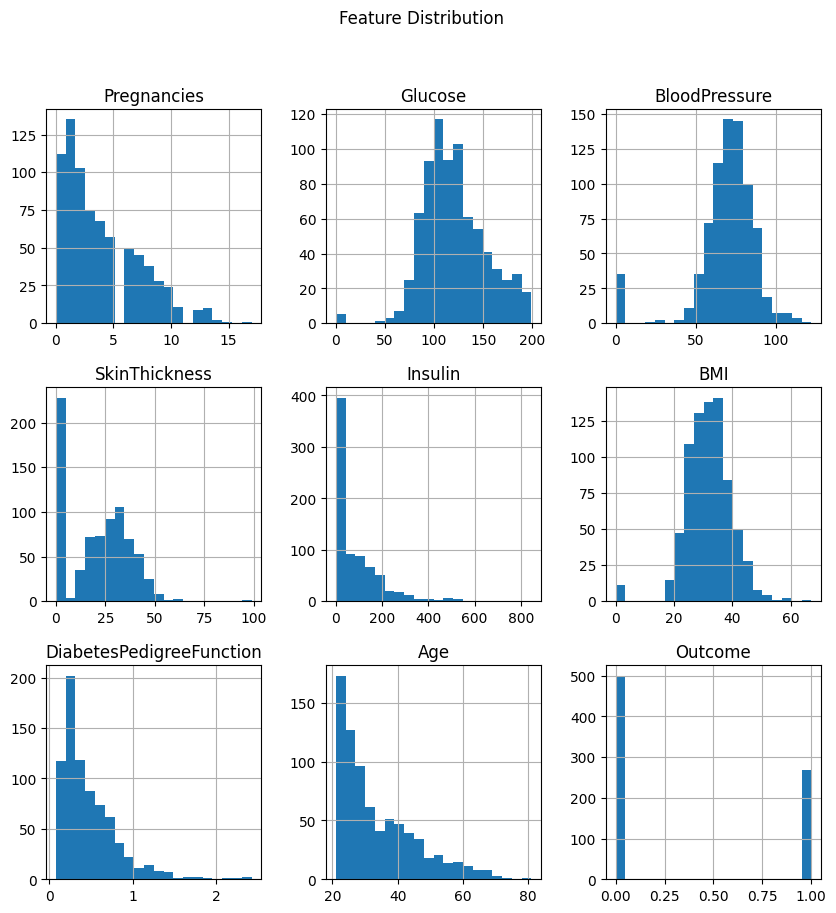

In [62]:
df.hist(bins=20, figsize=(10, 10))
plt.suptitle('Feature Distribution')
plt.show()

<Axes: xlabel='Outcome', ylabel='Age'>

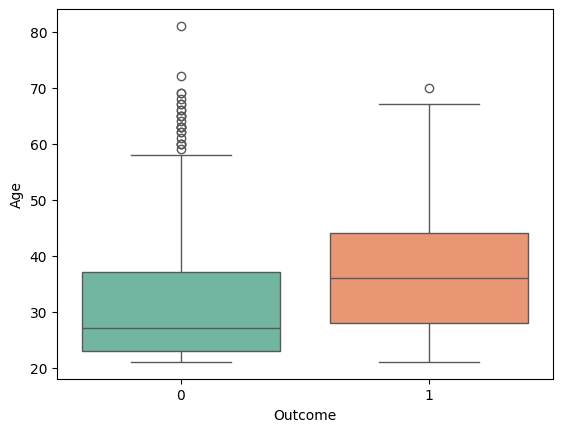

In [52]:
sns.boxplot(x='Outcome', y='Age', data=df, palette='Set2')


<Axes: xlabel='Pregnancies'>

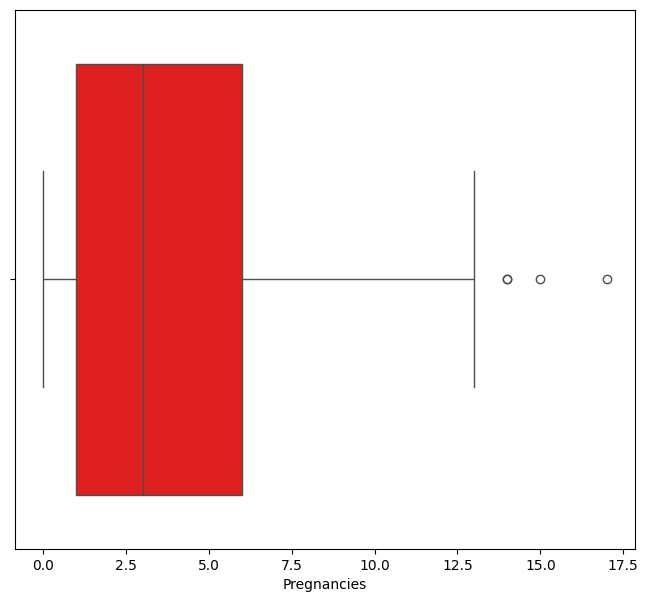

In [25]:
plt.figure(figsize=(8,7))
sns.boxplot(x=df['Pregnancies'], color="r",)

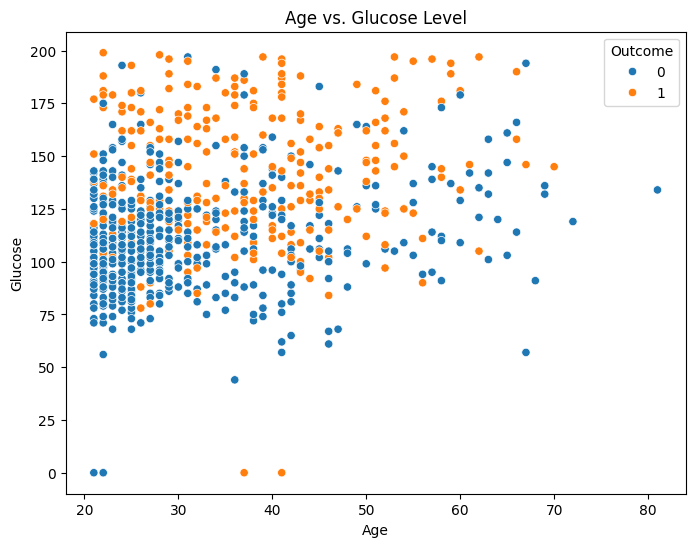

In [45]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='Glucose', data=df, hue='Outcome')
plt.title('Age vs. Glucose Level')
plt.show()

<Figure size 1000x1000 with 0 Axes>

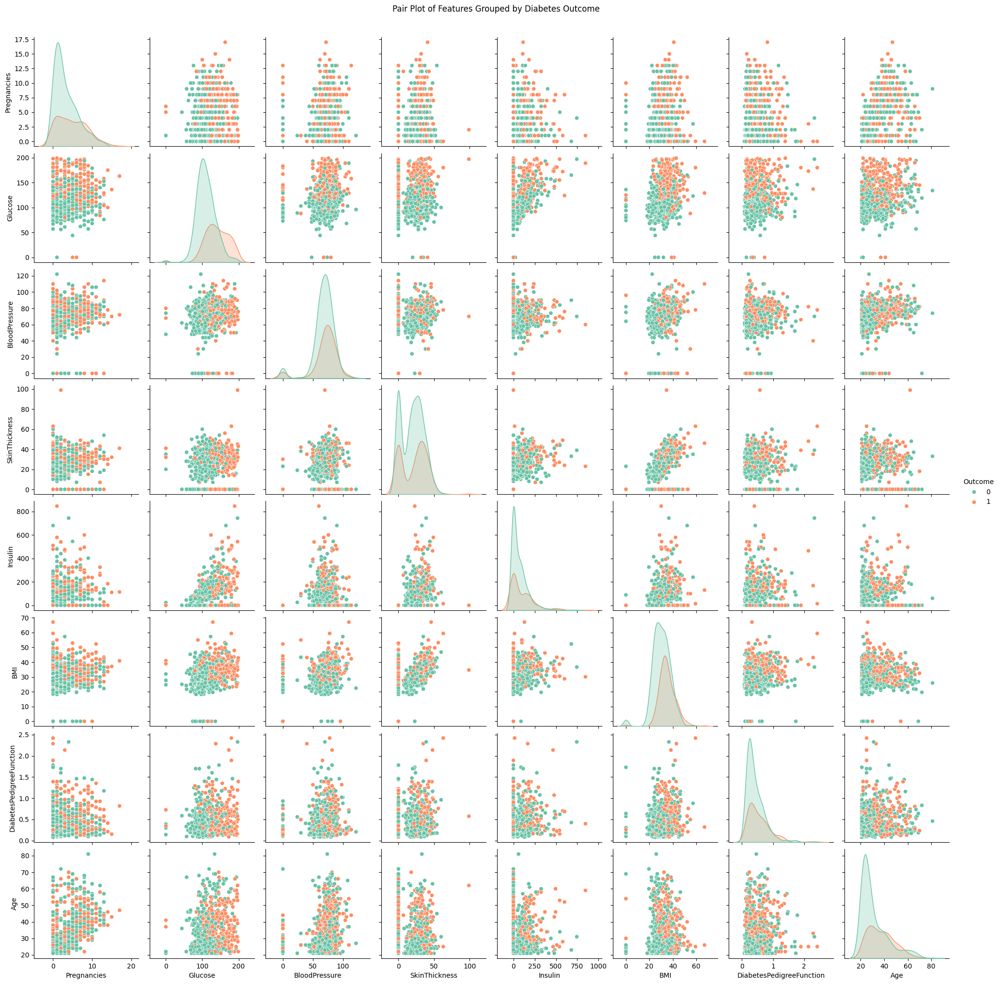

In [67]:
plt.figure(figsize=(10, 10))
sns.pairplot(df, hue='Outcome', palette='Set2')
plt.suptitle('Pair Plot of Features Grouped by Diabetes Outcome', y=1.02)
plt.show()

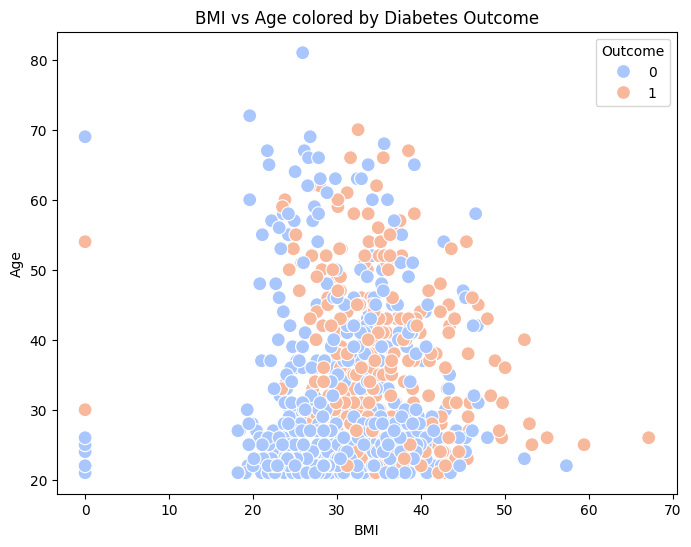

In [69]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='BMI', y='Age', hue='Outcome', data=df, palette='coolwarm', s=100)
plt.title('BMI vs Age colored by Diabetes Outcome')
plt.show()

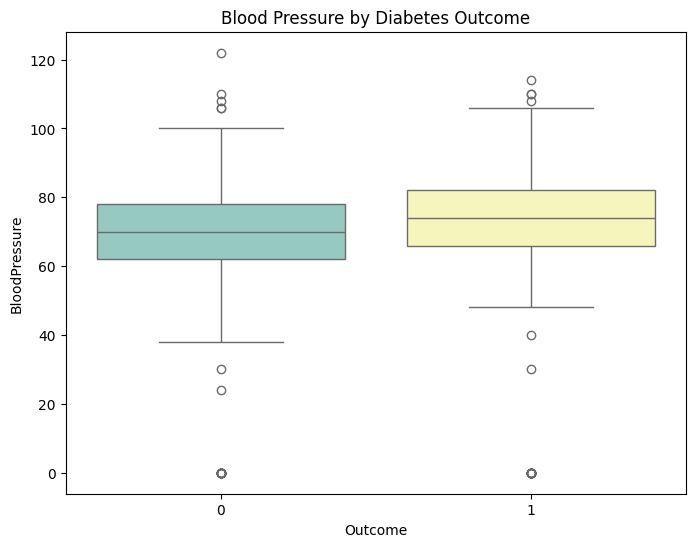

In [54]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Outcome', y='BloodPressure', data=df, palette='Set3')
plt.title('Blood Pressure by Diabetes Outcome')
plt.show()

Text(0.5, 1.0, 'Glucose in Dataset')

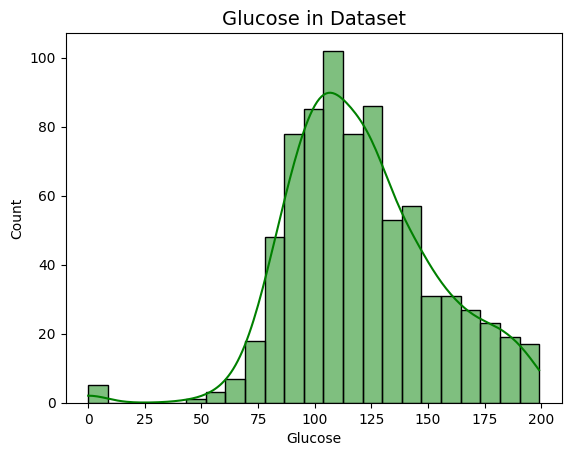

In [11]:
sns.histplot(df['Glucose'],color='g',kde=True)
plt.title('Glucose in Dataset', fontsize=14)


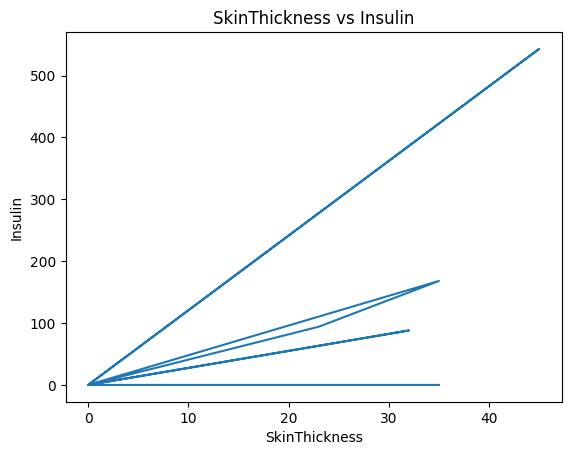

In [7]:
x=df['SkinThickness'].head(10)
y=df['Insulin'].head(10)
plt.plot(x,y)
plt.xlabel('SkinThickness')
plt.ylabel('Insulin')
plt.title('SkinThickness vs Insulin')
plt.show()

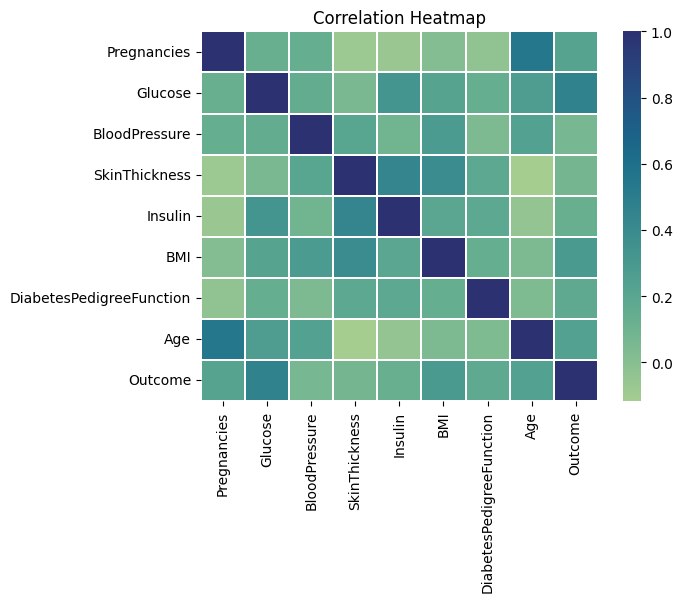

In [44]:
sns.heatmap(df.corr(),cmap='crest',linewidths=.1 )
plt.title('Correlation Heatmap')
plt.show()

In [14]:
from ydata_profiling import ProfileReport


In [15]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]